# Eksperyment 3: 
## Warunkowa rekonstrukcja funkcji 1D z użyciem FunDPS

Celem niniejszego eksperymentu jest zbadanie skuteczności metody FunDPS w rozwiązywaniu liniowych problemów odwrotnych (ang. *inverse problems*) dla wykresów funkcji 1D. Zadanie polega na dokładnej rekonstrukcji całego przebiegu funkcji na podstawie jedynie rzadkich, niepełnych pomiarów (punktów obserwacyjnych). 

W przeciwieństwie do poprzednich eksperymentów, które skupiały się na generacji bezwarunkowej lub prostym odszumianiu, ten etap wprowadza warunkowanie (guidance) w fazie inferencji. Model dyfuzyjny musi znaleźć złoty środek między wyuczoną wiedzą o ogólnym kształcie funkcji (tzw. *prior*), a wiernością względem dostarczonych, sztywnych punktów pomiarowych (*likelihood*).

W ramach badania przeprowadzone zostaną dwie główne analizy:


1. **Wpływ struktury szumu:** Porównanie klasycznego, nieskorelowanego szumu białego (White Noise) ze skorelowanym szumem przestrzennym opartym na stochastycznych polach Gaussa (Gaussian Random Field - GRF).


2. **Analiza hiperparametrów warunkowania:** Zbadanie przestrzeni parametrów - głównie siły modyfikacji gradientowej (parametr $\zeta$, Zeta) oraz liczby kroków dyfuzji – i ich wpływu na stabilność numeryczną oraz końcowy błąd rekonstrukcji (L2 Error).

In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import itertools
import pandas as pd
import time
import math
import os
import sys
import pickle
from tqdm import tqdm
import matplotlib.pyplot as plt
from IPython.display import display, HTML
import logging
import seaborn as sns


sys.path.append(os.path.abspath('..'))
from utils.samplers import MathFunctions
from utils.metrics import calculate_metrics
import utils.visualisations as vis

from models.edm1d import FunDPSSampler, FunDPSExperimentRunner, generate_grf_1d, SigmaEmbedding, EDMDenoiser1D, ForwardOperator

import warnings
warnings.filterwarnings('ignore', module='ipywidgets')
logging.getLogger("widgets").setLevel(logging.ERROR)
%matplotlib inline

In [2]:
print(f"Urządzenie obliczeniowe: {torch.device('cuda' if torch.cuda.is_available() else 'cpu')}")

Urządzenie obliczeniowe: cuda


### 1. Proces Sampling'u i wstrzykiwanie warunku (FunDPS)
Uruchamiana jest pętla odszumiająca, jednak tym razem jest ona modyfikowana w locie. 

W każdym kroku dyskretnym od $T$ do $0$, zaszumiony sygnał jest najpierw przetwarzany przez sieć neuronową. Następnie obliczany jest gradient różnicy między wygenerowaną próbką a punktami pomiarowymi. 

Ten gradient (przemnożony przez parametr siły $\zeta$) jest dodawany do wektora aktualizującego stan sygnału.

In [3]:
target_functions = [
    'square_wave',         
    'damped_oscillator',  
    'mixed_freq',         
    'chirp',              
    'sinc',                
    'step',                
    'abs',                 
    'log10',              
    '1_over_x',           
    'exp'                
]

PRIOR_EPOCHS = 2000 
STEPS_TO_TEST = [2,5,10,20, 50, 100, 200] 
ZETAS_TO_TEST = [2,4,6,8, 10, 100]

runner_white = FunDPSExperimentRunner(noise_type='white')
runner_grf = FunDPSExperimentRunner(noise_type='grf', sigma_kernel=2.0)

results_white = {}
results_grf = {}

os.makedirs('experiments/cache/results_cache_3', exist_ok=True)

print(f"{'='*60}\nROZPOCZYNANIE EKSPERYMENTÓW FUNDPS: WHITE vs GRF\n{'='*60}")

for func in target_functions:
    try:
        cache_white_file = f"experiments/cache/results_cache_3/fundps_white_{func}.pkl"
        
        if os.path.exists(cache_white_file):
            print(f"Wczytano wyniki z dysku dla FunDPS WHITE ({func.upper()})")
            with open(cache_white_file, 'rb') as f:
                results_white[func] = pickle.load(f)
        else:
            results_white[func] = runner_white.run_ablation_study(
                func, n_steps_list=STEPS_TO_TEST, zetas=ZETAS_TO_TEST, prior_epochs=PRIOR_EPOCHS
            )
            with open(cache_white_file, 'wb') as f:
                pickle.dump(results_white[func], f)
                
        cache_grf_file = f"experiments/cache/results_cache_3/fundps_grf_{func}.pkl"
        
        if os.path.exists(cache_grf_file):
            print(f"Wczytano wyniki z dysku dla FunDPS GRF ({func.upper()})")
            with open(cache_grf_file, 'rb') as f:
                results_grf[func] = pickle.load(f)
        else:
            results_grf[func] = runner_grf.run_ablation_study(
                func, n_steps_list=STEPS_TO_TEST, zetas=ZETAS_TO_TEST, prior_epochs=PRIOR_EPOCHS
            )
            with open(cache_grf_file, 'wb') as f:
                pickle.dump(results_grf[func], f)

    except Exception as e:
        print(f"Pominięto funkcję {func} ze względu na błąd: {e}")

ROZPOCZYNANIE EKSPERYMENTÓW FUNDPS: WHITE vs GRF
Wczytano wyniki z dysku dla FunDPS WHITE (SQUARE_WAVE)
Wczytano wyniki z dysku dla FunDPS GRF (SQUARE_WAVE)
Wczytano wyniki z dysku dla FunDPS WHITE (DAMPED_OSCILLATOR)
Wczytano wyniki z dysku dla FunDPS GRF (DAMPED_OSCILLATOR)
Wczytano wyniki z dysku dla FunDPS WHITE (MIXED_FREQ)
Wczytano wyniki z dysku dla FunDPS GRF (MIXED_FREQ)
Wczytano wyniki z dysku dla FunDPS WHITE (CHIRP)
Wczytano wyniki z dysku dla FunDPS GRF (CHIRP)
Wczytano wyniki z dysku dla FunDPS WHITE (SINC)
Wczytano wyniki z dysku dla FunDPS GRF (SINC)
Wczytano wyniki z dysku dla FunDPS WHITE (STEP)
Wczytano wyniki z dysku dla FunDPS GRF (STEP)
Wczytano wyniki z dysku dla FunDPS WHITE (ABS)
Wczytano wyniki z dysku dla FunDPS GRF (ABS)
Wczytano wyniki z dysku dla FunDPS WHITE (LOG10)
Wczytano wyniki z dysku dla FunDPS GRF (LOG10)
Wczytano wyniki z dysku dla FunDPS WHITE (1_OVER_X)
Wczytano wyniki z dysku dla FunDPS GRF (1_OVER_X)
Wczytano wyniki z dysku dla FunDPS WHITE (E

# Wizualizacje
## MAKRO

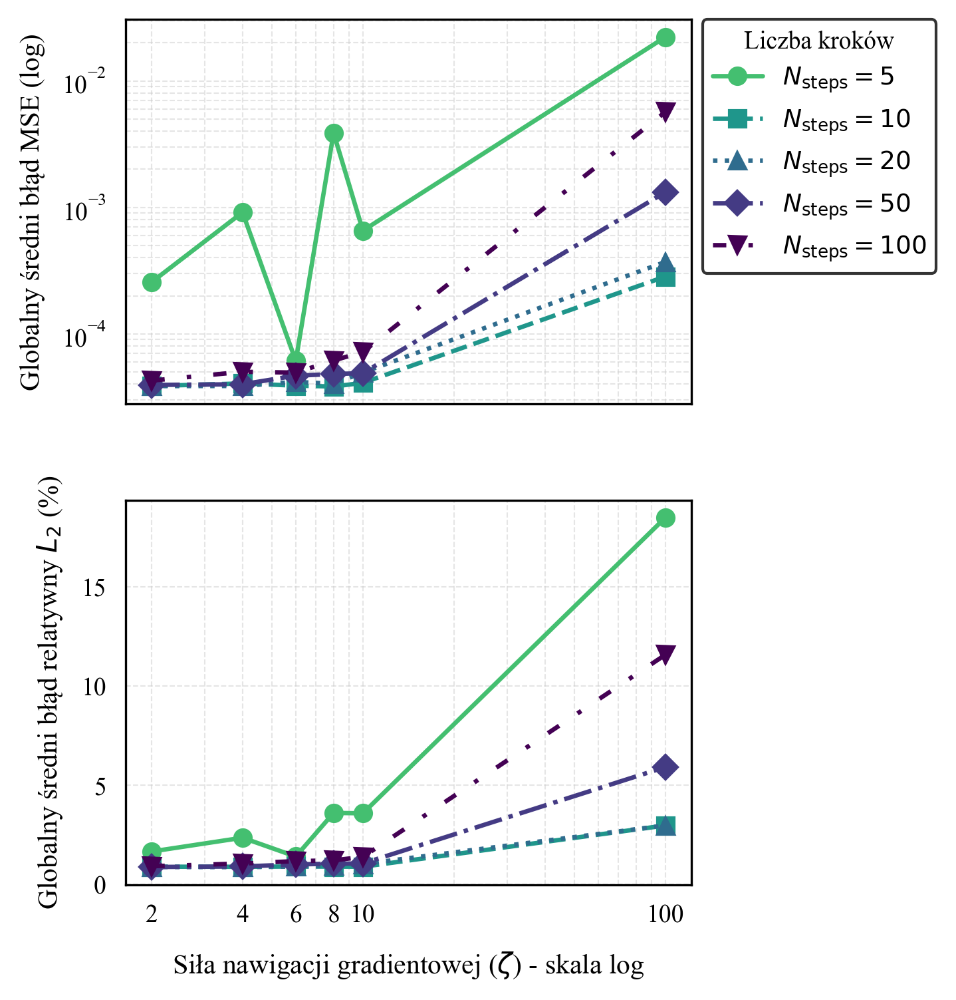

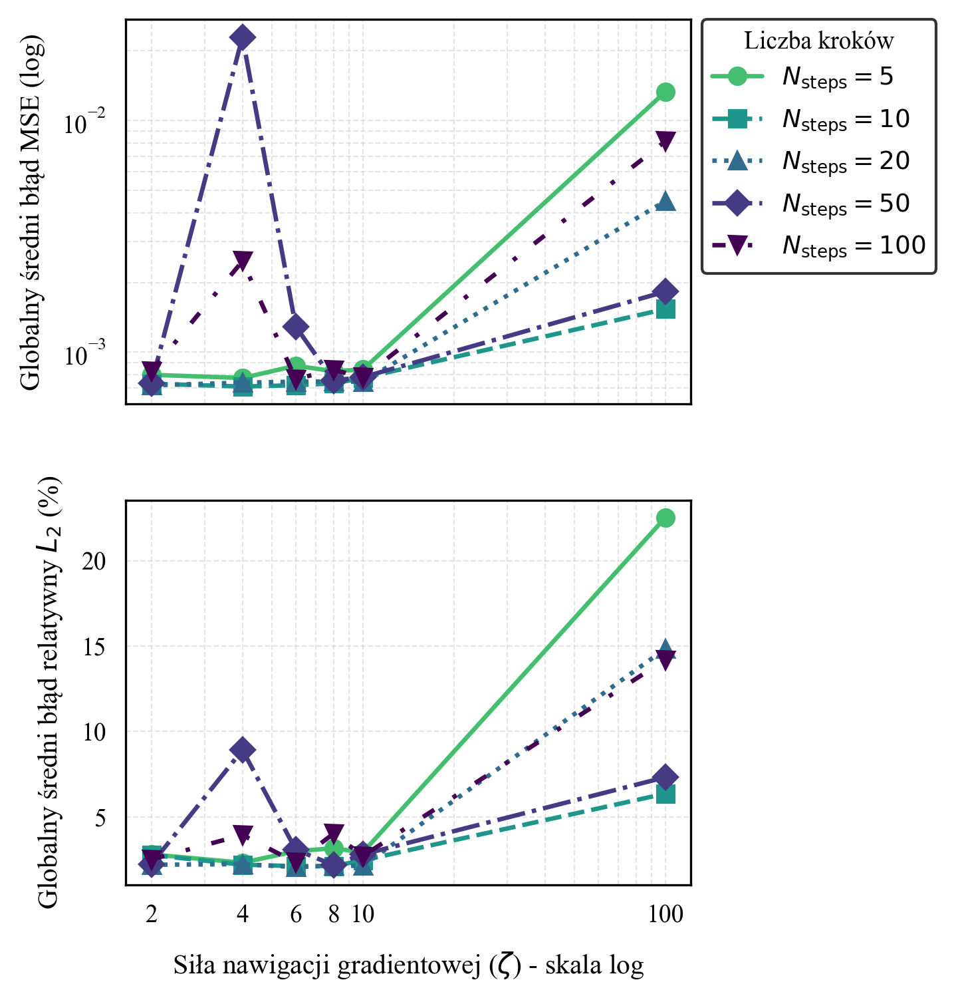

  Test R² = -0.014
 R² < 0.3 — ważności mogą być niestabilne!

-----------------------------------------------------------------
 WRAŻLIWOŚĆ HIPERPARAMETRÓW DLA SZUMU: WHITE
-----------------------------------------------------------------
  Steps                              : +0.0000 ± 0.0001
  Zeta                               : +0.0000 ± 0.0001
-----------------------------------------------------------------
  Test R² = -0.484
 R² < 0.3 — ważności mogą być niestabilne!

-----------------------------------------------------------------
 WRAŻLIWOŚĆ HIPERPARAMETRÓW DLA SZUMU: GRF
-----------------------------------------------------------------
  Steps                              : +1.0925 ± 1.1997
  Zeta                               : +1.8963 ± 1.3235
-----------------------------------------------------------------


In [4]:
#Pokazanie globalnych trendów dla MSE i L_2
vis.plot_fundps_linear_trends_global(results_white, noise_name='White')
vis.plot_fundps_linear_trends_global(results_grf, noise_name='GRF')

importance_white = vis.calculate_fundps_feature_importance(results_white, noise_name='White')
importance_grf = vis.calculate_fundps_feature_importance(results_grf, noise_name='GRF')


  ANALIZA N_STEPS — SZUM: GAUSSIAN

[A] Korelacja Spearmana (Steps → L2_Error):
    ρ = -0.286,  p = 0.5345  — brak istotności

[B] Zrównoważony punkt roboczy (elbow):
    N_steps  = 5
    L2_Error = 2.673%

[C] Istotność poprawy między krokami (Mann-Whitney U):
          Para    Δmediana     p-value    Sig        Strefa
    -------------------------------------------------------
           2→5    +317.795      0.0000      ✓   przed elbow
          5→10      +2.153      0.0000      ✓      po elbow
         10→20      -0.020      0.6246      ✗      po elbow
         20→50      -0.100      0.8549      ✗      po elbow
        50→100      -0.267      0.9490      ✗      po elbow
       100→200      -0.677      0.9863      ✗      po elbow

  WNIOSEK
  Istotne poprawy przed elbow (N≤5): 1
  Istotne poprawy po elbow    (N>5): 1
  ✗ HIPOTEZA OBALONA



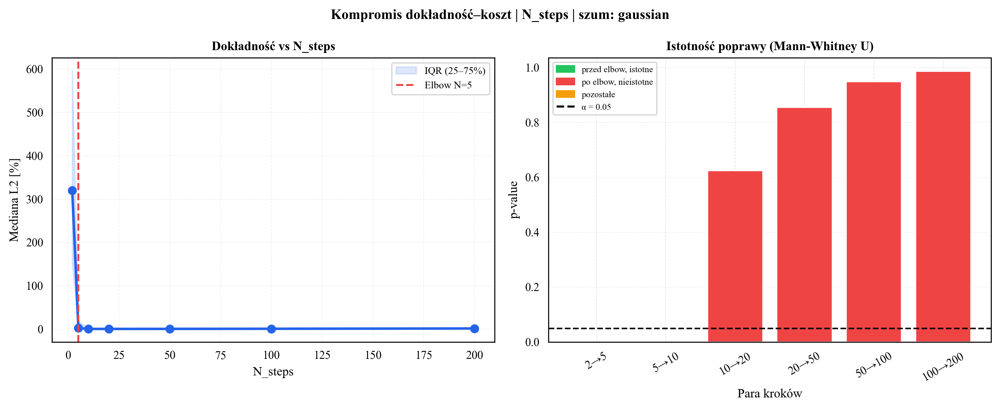


  ANALIZA N_STEPS — SZUM: GAUSSIAN

[A] Korelacja Spearmana (Steps → L2_Error):
    ρ = -0.321,  p = 0.4821  — brak istotności

[B] Zrównoważony punkt roboczy (elbow):
    N_steps  = 5
    L2_Error = 2.693%

[C] Istotność poprawy między krokami (Mann-Whitney U):
          Para    Δmediana     p-value    Sig        Strefa
    -------------------------------------------------------
           2→5    +287.652      0.0000      ✓   przed elbow
          5→10      +1.732      0.0024      ✓      po elbow
         10→20      +0.042      0.4447      ✗      po elbow
         20→50      -0.072      0.7680      ✗      po elbow
        50→100      -0.395      0.9229      ✗      po elbow
       100→200      -1.090      0.9522      ✗      po elbow

  WNIOSEK
  Istotne poprawy przed elbow (N≤5): 1
  Istotne poprawy po elbow    (N>5): 1
  ✗ HIPOTEZA OBALONA



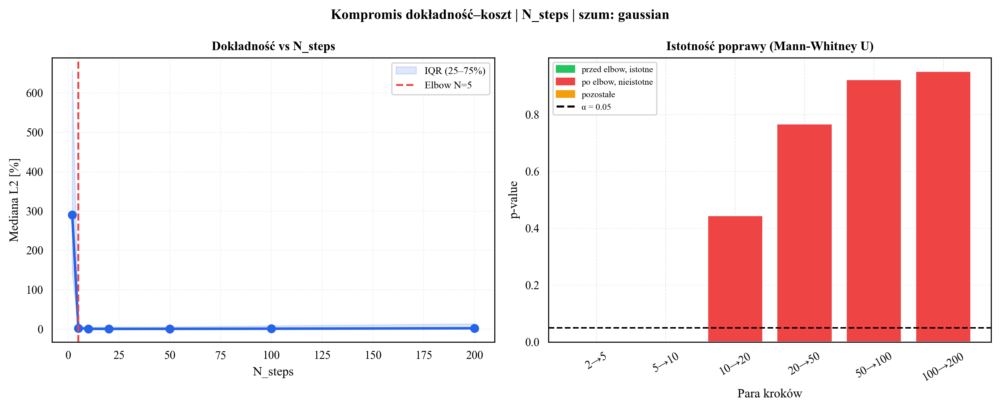

In [7]:
result = vis.analyze_nsteps_tradeoff(
    results_white,
    noise_name='gaussian',
    time_col='Inference_Time'  
)

result = vis.analyze_nsteps_tradeoff(
    results_grf,
    noise_name='gaussian',
    time_col='Inference_Time'   
)


  ANALIZA N_STEPS — SZUM: GLOBAL (WHITE + GRF)

[A] Korelacja Spearmana (Steps → L2_Error):
    ρ = -0.393,  p = 0.3833  — brak istotności

[B] Zrównoważony punkt roboczy (elbow):
    N_steps  = 5
    L2_Error = 2.693%

[C] Istotność poprawy między krokami (Mann-Whitney U):
          Para    Δmediana     p-value    Sig        Strefa
    -------------------------------------------------------
           2→5    +312.126      0.0000      ✓   przed elbow
          5→10      +1.790      0.0000      ✓      po elbow
         10→20      +0.014      0.5033      ✗      po elbow
         20→50      -0.006      0.8675      ✗      po elbow
        50→100      -0.299      0.9799      ✗      po elbow
       100→200      -0.628      0.9961      ✗      po elbow

  WNIOSEK
  Istotne poprawy przed elbow (N≤5): 1
  Istotne poprawy po elbow    (N>5): 1
  ✗ HIPOTEZA OBALONA



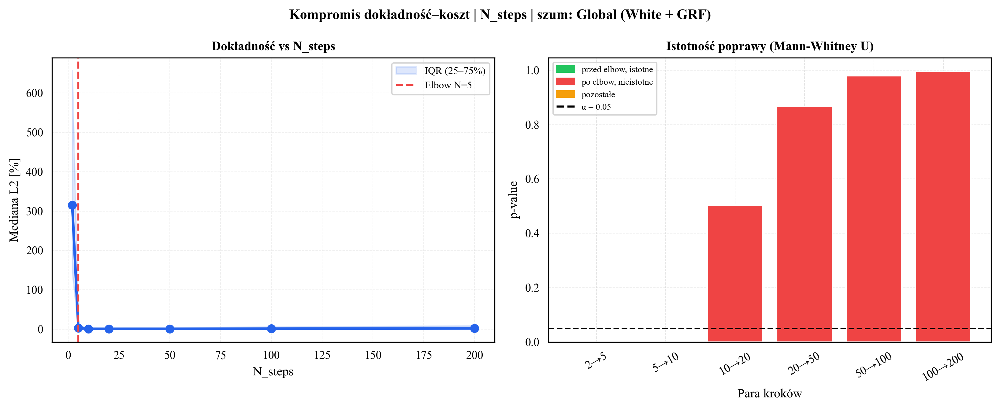

In [8]:
# Tworzymy jeden wspólny słownik z unikalnymi kluczami
global_results = {}

for func_name, func_data in results_white.items():
    global_results[f"{func_name}_white"] = func_data

for func_name, func_data in results_grf.items():
    global_results[f"{func_name}_grf"] = func_data

global_result = vis.analyze_nsteps_tradeoff(
    global_results,
    noise_name='Global (White + GRF)',
    time_col='Inference_Time'
)

       ANALIZA WPŁYWU LICZBY KROKÓW (N_STEPS) NA CZAS
N_steps    | Mediana czasu [s]  | Odchylenie std [s]
-----------------------------------------------------------------
2          | 16.0225            | 1.1320            
5          | 16.0386            | 1.1306            
10         | 16.0678            | 1.1307            
20         | 16.1256            | 1.1314            
50         | 16.2948            | 1.1347            
100        | 16.5925            | 1.1344            
200        | 17.1124            | 1.1362            

[Statystyka korelacji]:
  Korelacja Spearmana (skala rangowa): ρ = +0.3453 (p-value: 6.2793e-25)
  Korelacja Pearsona  (skala liniowa) : r = +0.3204 (p-value: 1.6465e-21)
-----------------------------------------------------------------
? WNIOSEK: Zależność nie jest jednoznaczna. Sprawdź, czy procesor/GPU nie narzucił dodatkowych opóźnień.


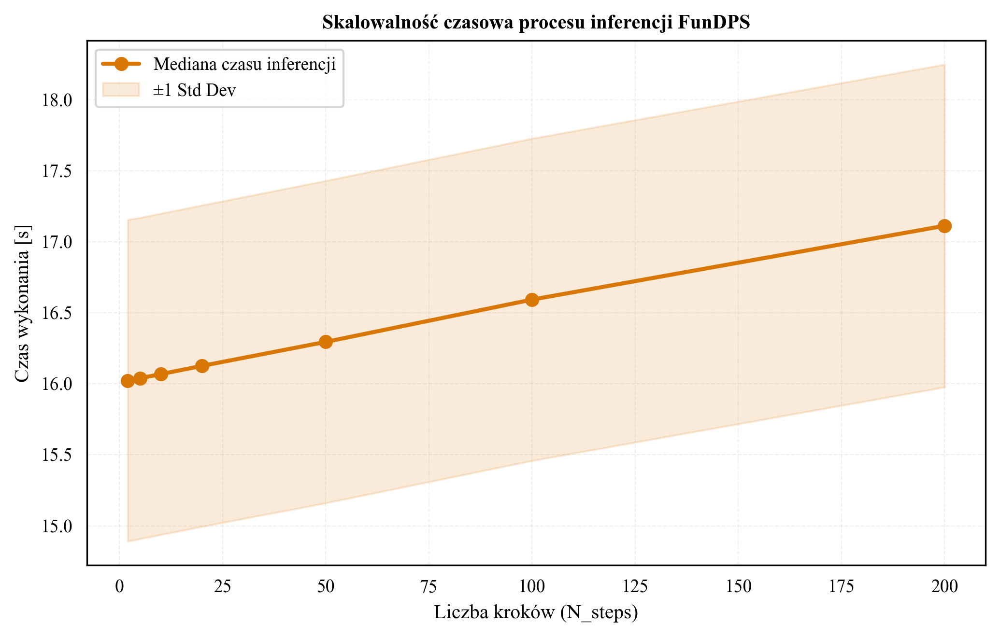

In [9]:
from scipy.stats import pearsonr, spearmanr
import matplotlib.pyplot as plt
import pandas as pd

all_records = []
for func_name, func_data in global_results.items():
    if func_data is not None and 'metrics_history' in func_data:
        df_func = pd.DataFrame(func_data['metrics_history'])
        all_records.append(df_func)

df_time = pd.concat(all_records, ignore_index=True)

time_col_name = 'Inference_Time' if 'Inference_Time' in df_time.columns else 'Total_Time_s'

agg_time = (
    df_time.groupby('Steps')[time_col_name]
    .agg(mediana_czasu='median', srednia_czasu='mean', std_czasu='std')
    .reset_index()
)

rho, p_val = spearmanr(df_time['Steps'], df_time[time_col_name])
r_pearson, p_pearson = pearsonr(df_time['Steps'], df_time[time_col_name])

print("=" * 65)
print("       ANALIZA WPŁYWU LICZBY KROKÓW (N_STEPS) NA CZAS")
print("=" * 65)
print(f"{'N_steps':<10} | {'Mediana czasu [s]':<18} | {'Odchylenie std [s]':<18}")
print("-" * 65)
for row in agg_time.itertuples():
    print(f"{int(row.Steps):<10} | {row.mediana_czasu:<18.4f} | {row.std_czasu:<18.4f}")
print("=" * 65)
print("\n[Statystyka korelacji]:")
print(f"  Korelacja Spearmana (skala rangowa): ρ = {rho:+.4f} (p-value: {p_val:.4e})")
print(f"  Korelacja Pearsona  (skala liniowa) : r = {r_pearson:+.4f} (p-value: {p_pearson:.4e})")
print("-" * 65)

if rho > 0.9:
    print("WNIOSEK: Istnieje bardzo silna, niemal idealna zależność.")
    print("  Zwiększanie liczby kroków N liniowo wydłuża czas obliczeń.")
else:
    print("? WNIOSEK: Zależność nie jest jednoznaczna. Sprawdź, czy procesor/GPU nie narzucił dodatkowych opóźnień.")
print("=" * 65)

plt.figure(figsize=(7, 4.5))
plt.plot(agg_time['Steps'], agg_time['mediana_czasu'], 'o-', color='#d97706', lw=2, label='Mediana czasu inferencji')
plt.fill_between(agg_time['Steps'], 
                 agg_time['mediana_czasu'] - agg_time['std_czasu'].fillna(0), 
                 agg_time['mediana_czasu'] + agg_time['std_czasu'].fillna(0),
                 alpha=0.15, color='#d97706', label='±1 Std Dev')
plt.xlabel('Liczba kroków (N_steps)')
plt.ylabel('Czas wykonania [s]')
plt.title('Skalowalność czasowa procesu inferencji FunDPS')
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.savefig('../images/experiment3/nsteps_time_scaling.pdf', bbox_inches='tight')
plt.show()

    Kroki (N_steps)  Siła nawigacji (Zeta)  Średni globalny błąd L2 (%)  Średni łączny czas [s]
0                20                      4                         0.86                   14.53
1                50                      2                         0.87                   14.70
2                20                      2                         0.87                   14.53
3                10                      4                         0.88                   14.47
4                10                     10                         0.88                   14.47
5                10                      2                         0.88                   14.47
6                10                      8                         0.89                   14.47
7                20                      6                         0.89                   14.53
8                10                      6                         0.89                   14.47
9                50                     

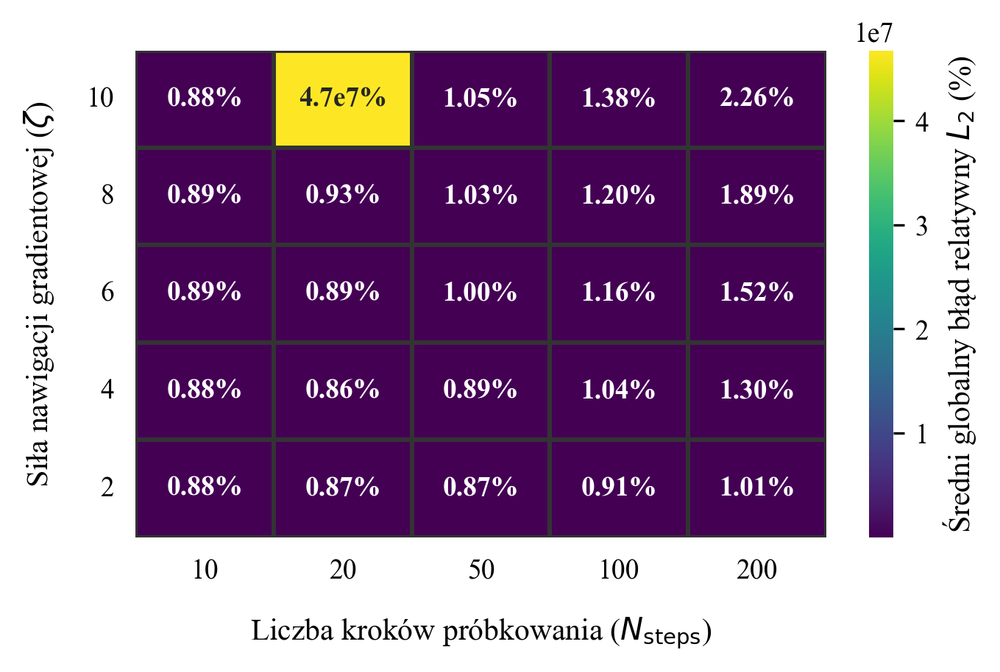

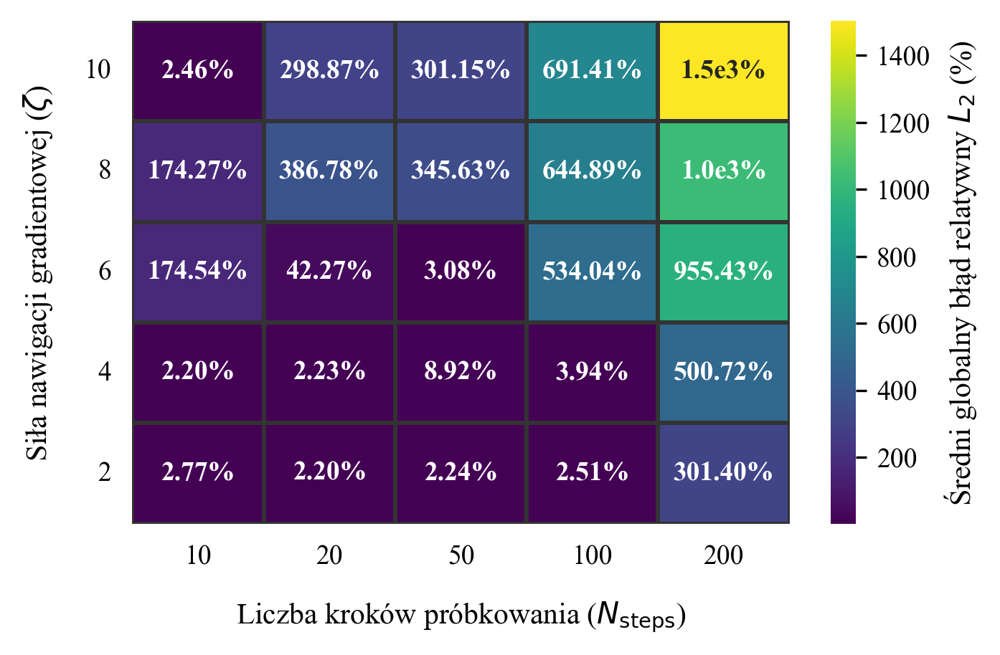

In [10]:
# Usunięcie anomalii i precyzyjne mapowanie ułamkowych różnic błędu.
df_white_report = vis.generate_fundps_summary_table(results_white, noise_name='White')
df_grf_report = vis.generate_fundps_summary_table(results_grf, noise_name='GRF')

vis.plot_parameter_matrix_zoom(results_white, noise_name='White')
vis.plot_parameter_matrix_zoom(results_grf, noise_name='GRF')

In [11]:
# Zestawienie czasu operacji i błędu, sortowanie od najlepszych
vis.generate_fundps_summary_table(results_white, noise_name='White')
vis.generate_fundps_summary_table(results_grf, noise_name='GRF')

    Kroki (N_steps)  Siła nawigacji (Zeta)  Średni globalny błąd L2 (%)  Średni łączny czas [s]
0                20                      4                         0.86                   14.53
1                50                      2                         0.87                   14.70
2                20                      2                         0.87                   14.53
3                10                      4                         0.88                   14.47
4                10                     10                         0.88                   14.47
5                10                      2                         0.88                   14.47
6                10                      8                         0.89                   14.47
7                20                      6                         0.89                   14.53
8                10                      6                         0.89                   14.47
9                50                     

,Kroki (N_steps),Siła nawigacji (Zeta),Średni globalny błąd L2 (%),Średni łączny czas [s]
0,20,2,2.20,16.51
1,10,4,2.20,16.45
2,20,4,2.23,16.51
3,50,2,2.24,16.68
4,10,10,2.46,16.45
5,100,2,2.51,16.97
6,10,2,2.77,16.45
7,5,2,2.80,16.42
8,50,6,3.08,16.68
9,100,4,3.94,16.97


In [12]:
# Udowodnienie narzutu czasowego GRF
metrics_to_display = {
    'MSE': 'Błąd średniokwadratowy (MSE)',
    'MAE': 'Średni błąd bezwzględny (MAE)',
    'Wasserstein': 'Odległość Wassersteina',
    'L2_Error': 'Błąd relatywny L2 (%)',
    'Total_Time_s': 'Czas wykonania (Trening + Inferencja) [s]'
}

for metric_key, title in metrics_to_display.items():
    vis.display_fundps_comparison_table(results_white, results_grf, metric_key, title)


 METRYKA: BŁĄD ŚREDNIOKWADRATOWY (MSE)
------------------------------------------------------------


,FunDPS (White Noise),FunDPS (GRF Noise)
Funkcja,,
SQUARE_WAVE,0.000003,0.000038
DAMPED_OSCILLATOR,0.000082,0.000375
MIXED_FREQ,0.000002,0.000002
CHIRP,0.000185,0.000555
SINC,0.000003,0.000018
STEP,0.000017,0.000012
ABS,0.000003,0.000025
LOG10,0.000004,0.000006
1_OVER_X,0.000004,0.000002


------------------------------------------------------------

 METRYKA: ŚREDNI BŁĄD BEZWZGLĘDNY (MAE)
------------------------------------------------------------


,FunDPS (White Noise),FunDPS (GRF Noise)
Funkcja,,
SQUARE_WAVE,0.001415,0.004970
DAMPED_OSCILLATOR,0.007156,0.014907
MIXED_FREQ,0.001225,0.001103
CHIRP,0.011065,0.018689
SINC,0.001323,0.003756
STEP,0.003556,0.002881
ABS,0.001309,0.004147
LOG10,0.001703,0.001949
1_OVER_X,0.001541,0.001079


------------------------------------------------------------

 METRYKA: ODLEGŁOŚĆ WASSERSTEINA
------------------------------------------------------------


,FunDPS (White Noise),FunDPS (GRF Noise)
Funkcja,,
SQUARE_WAVE,0.001415,0.004970
DAMPED_OSCILLATOR,0.005649,0.009023
MIXED_FREQ,0.001150,0.001081
CHIRP,0.010763,0.013356
SINC,0.001272,0.003756
STEP,0.003556,0.002881
ABS,0.001309,0.004147
LOG10,0.001648,0.001852
1_OVER_X,0.001237,0.000758


------------------------------------------------------------

 METRYKA: BŁĄD RELATYWNY L2 (%)
------------------------------------------------------------


,FunDPS (White Noise),FunDPS (GRF Noise)
Funkcja,,
SQUARE_WAVE,0.18,0.62
DAMPED_OSCILLATOR,2.49,5.30
MIXED_FREQ,0.27,0.26
CHIRP,2.02,3.50
SINC,0.22,0.57
STEP,0.41,0.35
ABS,0.27,0.85
LOG10,0.30,0.35
1_OVER_X,1.16,0.81


------------------------------------------------------------

 METRYKA: CZAS WYKONANIA (TRENING + INFERENCJA) [S]
------------------------------------------------------------


,FunDPS (White Noise),FunDPS (GRF Noise)
Funkcja,,
SQUARE_WAVE,16.15,17.55
DAMPED_OSCILLATOR,14.38,16.92
MIXED_FREQ,14.46,16.66
CHIRP,15.10,16.25
SINC,14.20,16.43
STEP,14.03,16.19
ABS,14.29,16.80
LOG10,14.09,16.25
1_OVER_X,14.11,16.09


------------------------------------------------------------


 WIZUALIZACJA WYNIKÓW (WHITE vs GRF)


C:\Users\klaud\Desktop\PRACA-MAGISTERSKA-Zastosowanie-modeli-dyfuzyjnych-do-stabilizacji-wykresow-funkcji\utils\visualisations.py:2251: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  sns.barplot(data=df_plot, x='Funkcja', y='Wartość', hue='Szum priora',
C:\Users\klaud\Desktop\PRACA-MAGISTERSKA-Zastosowanie-modeli-dyfuzyjnych-do-stabilizacji-wykresow-funkcji\utils\visualisations.py:2257: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


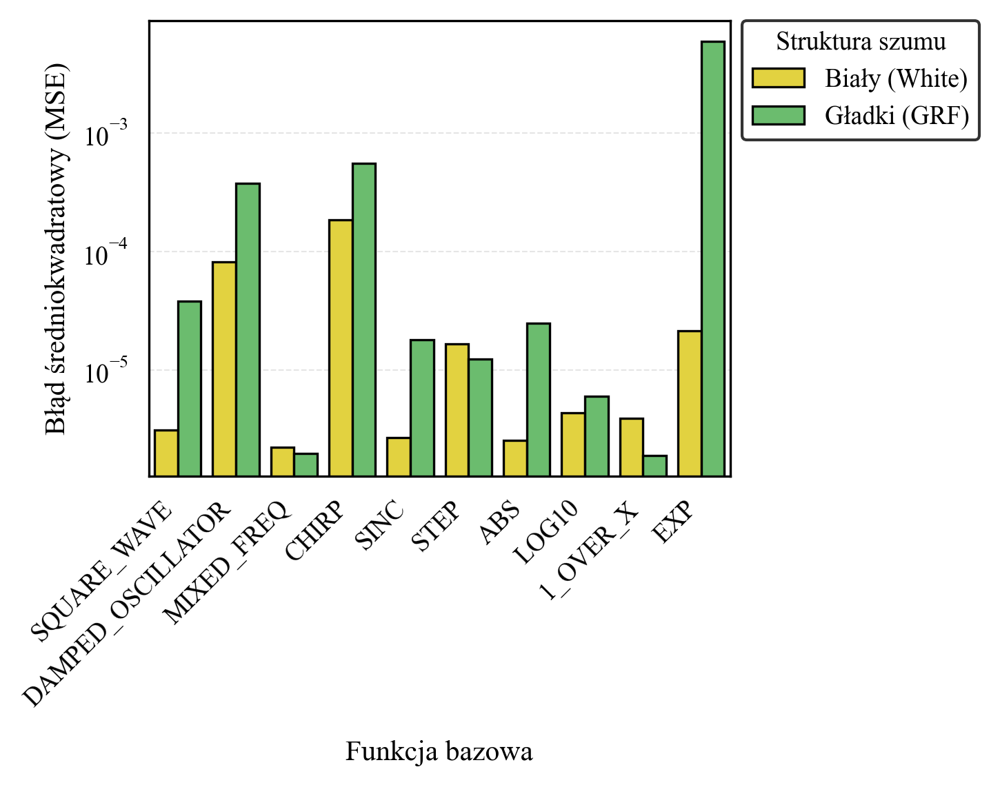

C:\Users\klaud\Desktop\PRACA-MAGISTERSKA-Zastosowanie-modeli-dyfuzyjnych-do-stabilizacji-wykresow-funkcji\utils\visualisations.py:2251: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  sns.barplot(data=df_plot, x='Funkcja', y='Wartość', hue='Szum priora',
C:\Users\klaud\Desktop\PRACA-MAGISTERSKA-Zastosowanie-modeli-dyfuzyjnych-do-stabilizacji-wykresow-funkcji\utils\visualisations.py:2257: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


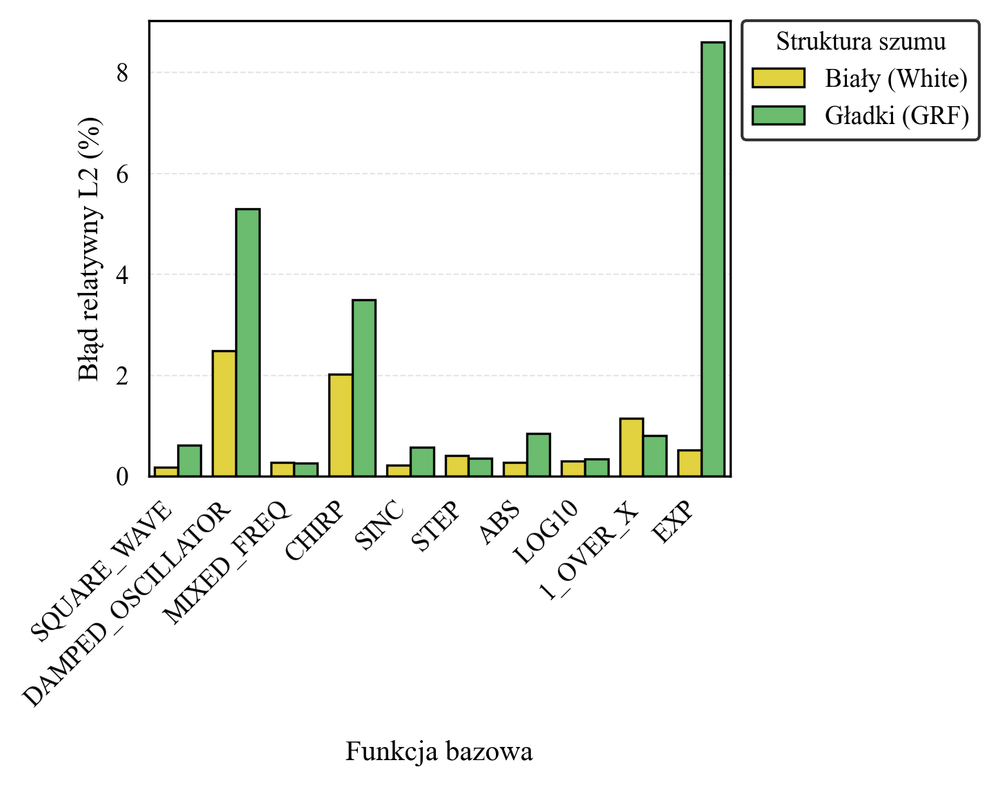

C:\Users\klaud\Desktop\PRACA-MAGISTERSKA-Zastosowanie-modeli-dyfuzyjnych-do-stabilizacji-wykresow-funkcji\utils\visualisations.py:2251: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  sns.barplot(data=df_plot, x='Funkcja', y='Wartość', hue='Szum priora',
C:\Users\klaud\Desktop\PRACA-MAGISTERSKA-Zastosowanie-modeli-dyfuzyjnych-do-stabilizacji-wykresow-funkcji\utils\visualisations.py:2257: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


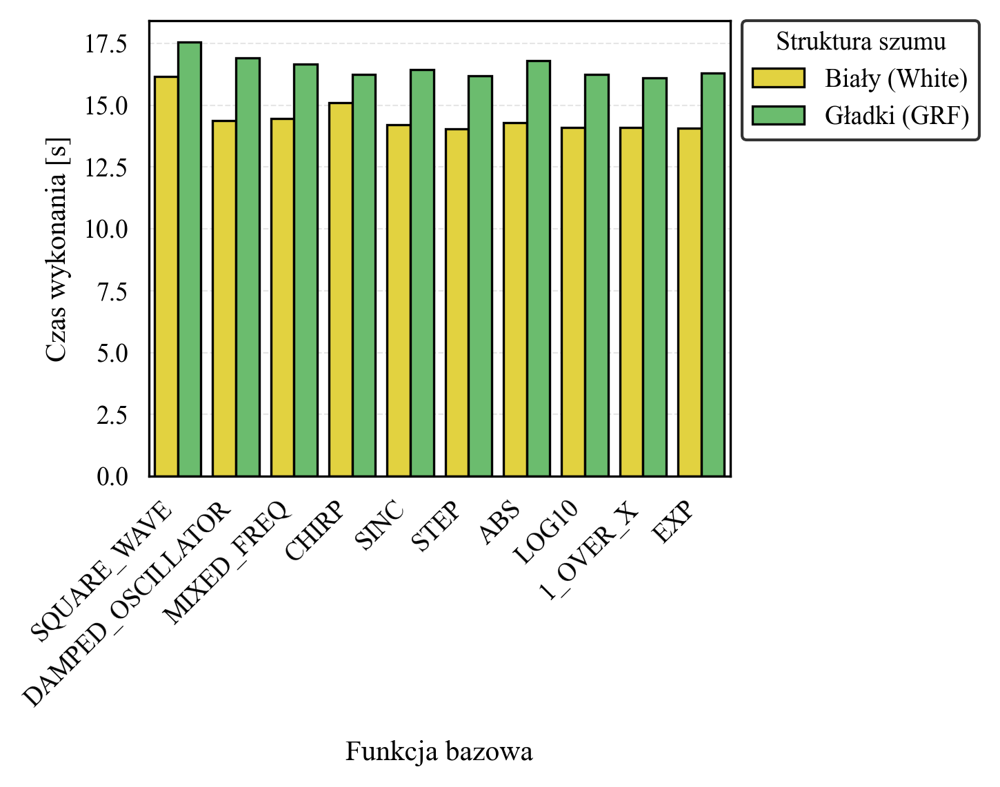

In [13]:
metrics_to_display = {
    'MSE': 'Błąd średniokwadratowy (MSE)',
    'L2_Error': 'Błąd relatywny L2 (%)',
    'Total_Time_s': 'Czas wykonania [s]'
}

print(f"{'='*60}\n WIZUALIZACJA WYNIKÓW (WHITE vs GRF)\n{'='*60}")
for metric_key, title in metrics_to_display.items():
    vis.plot_fundps_comparison_bars(results_white, results_grf, metric_key, title)

## MIKRO


GENEROWANIE NOWYCH WYKRESÓW DLA SQUARE_WAVE


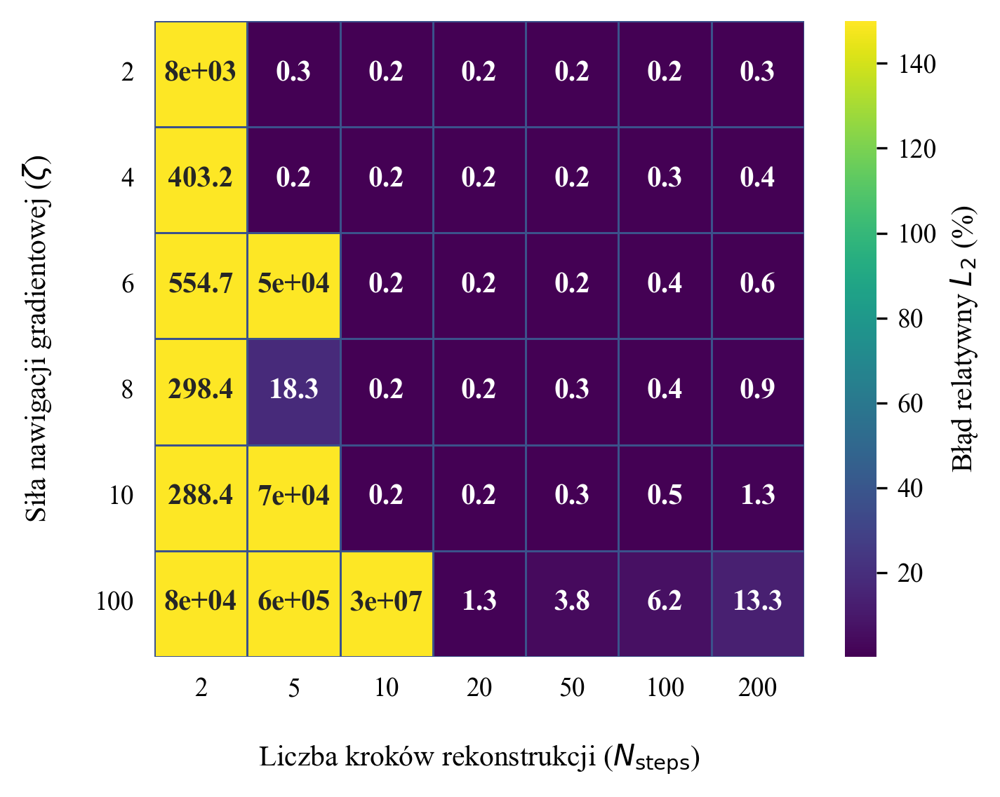

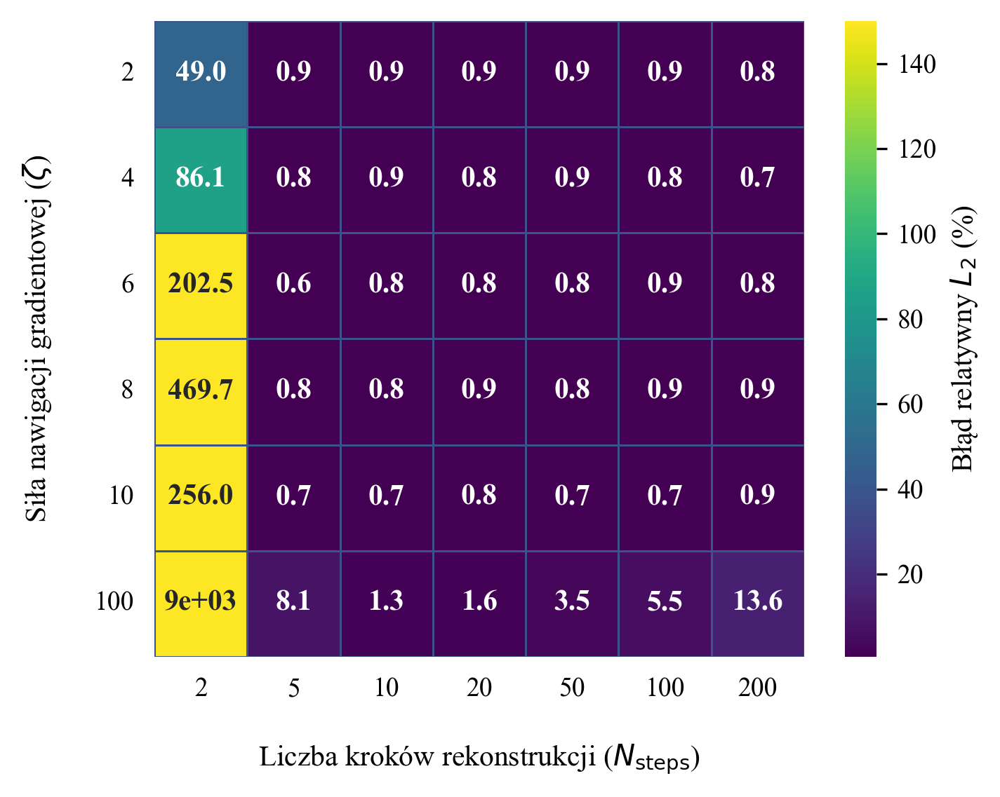

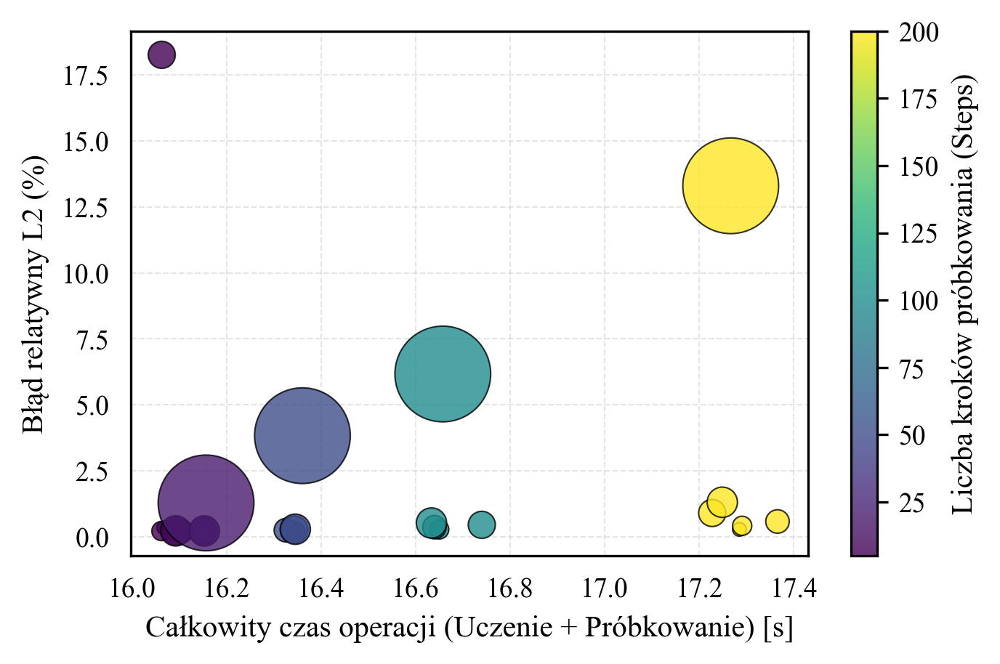

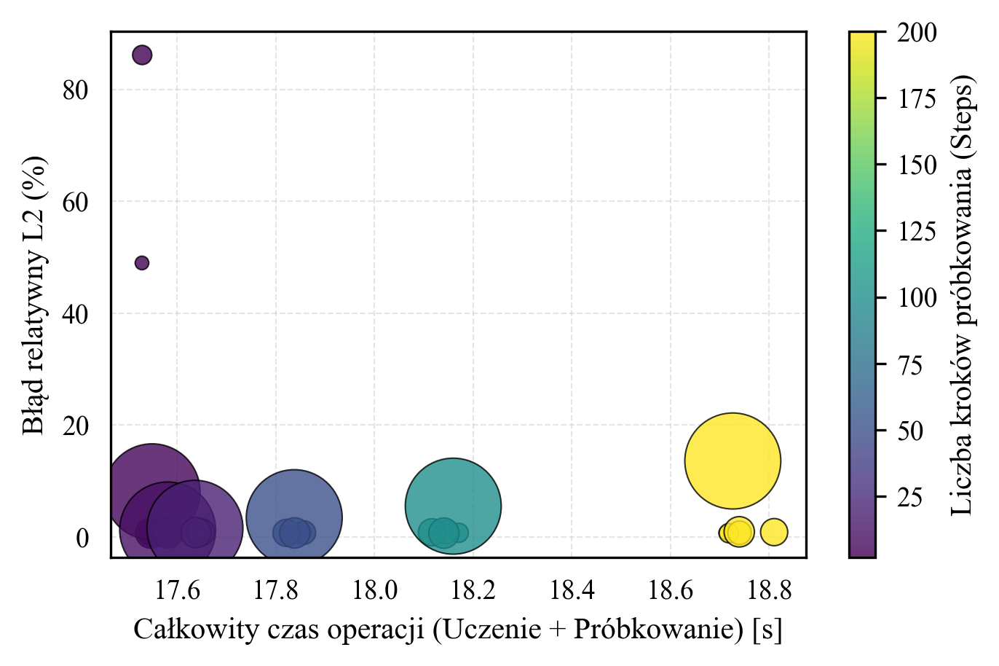

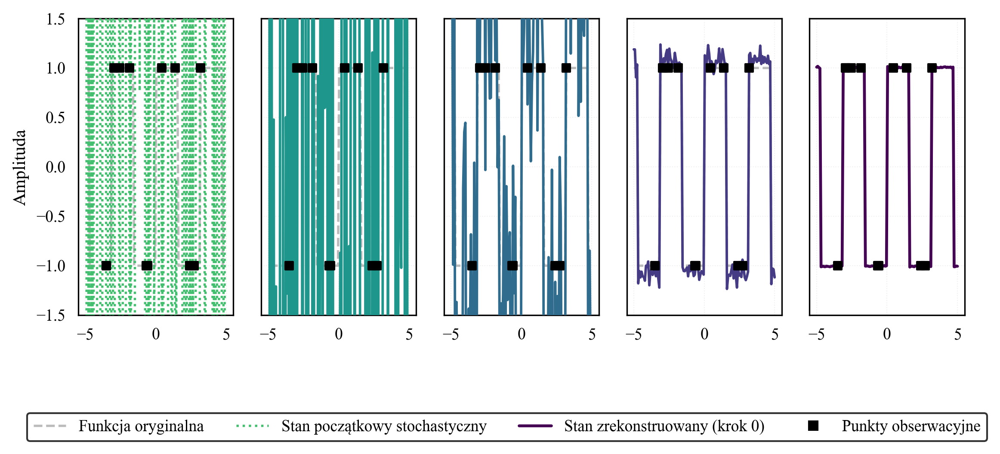

...

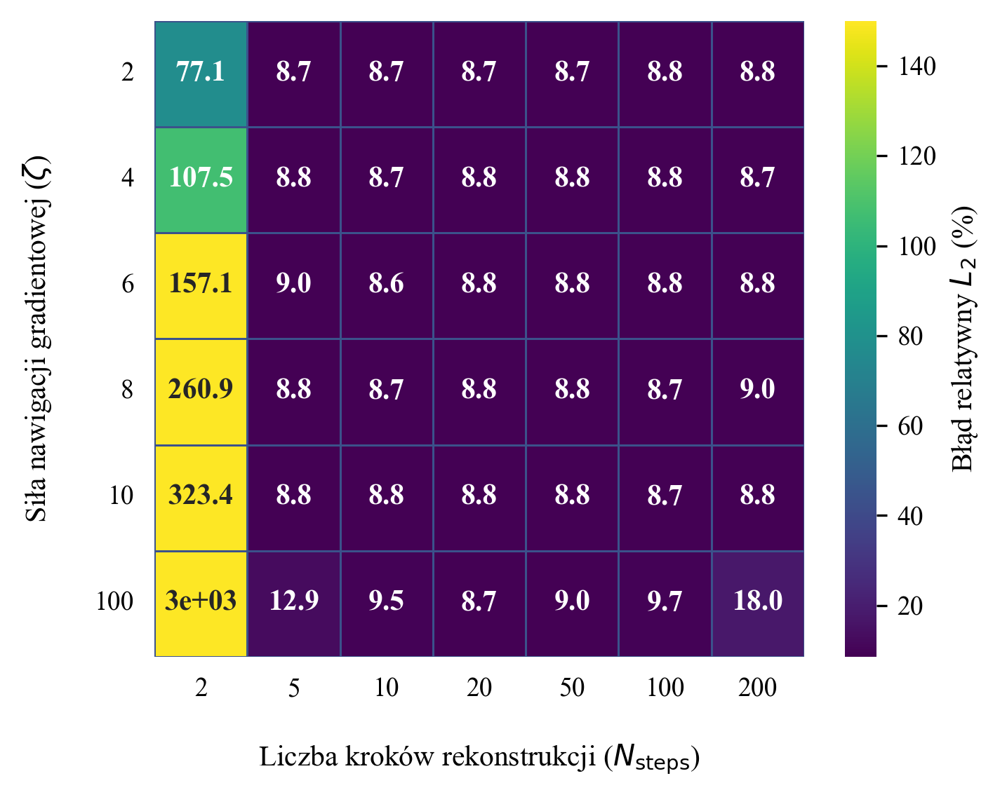

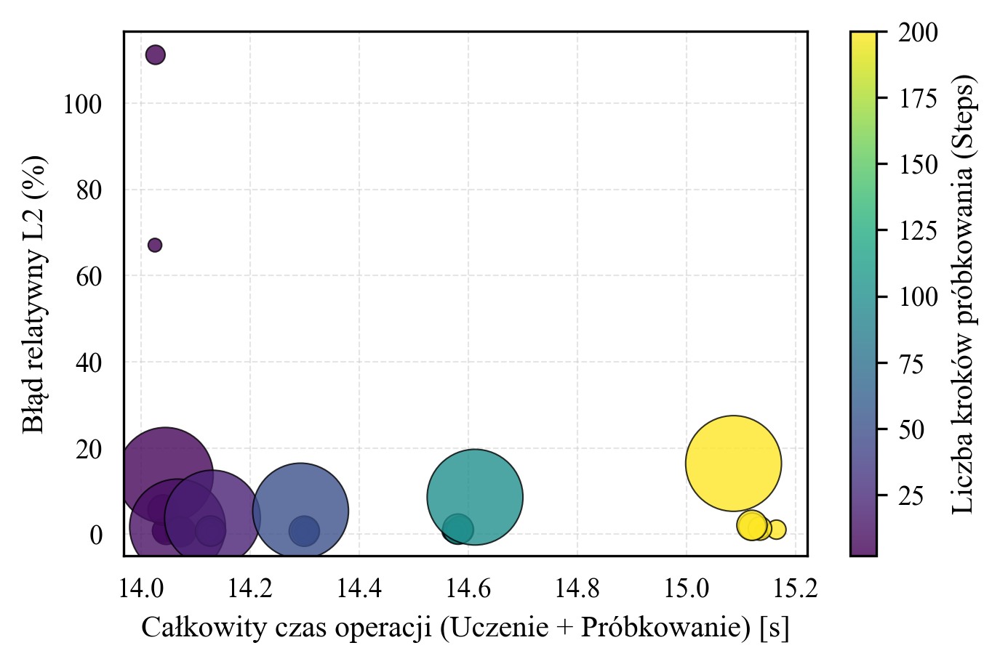

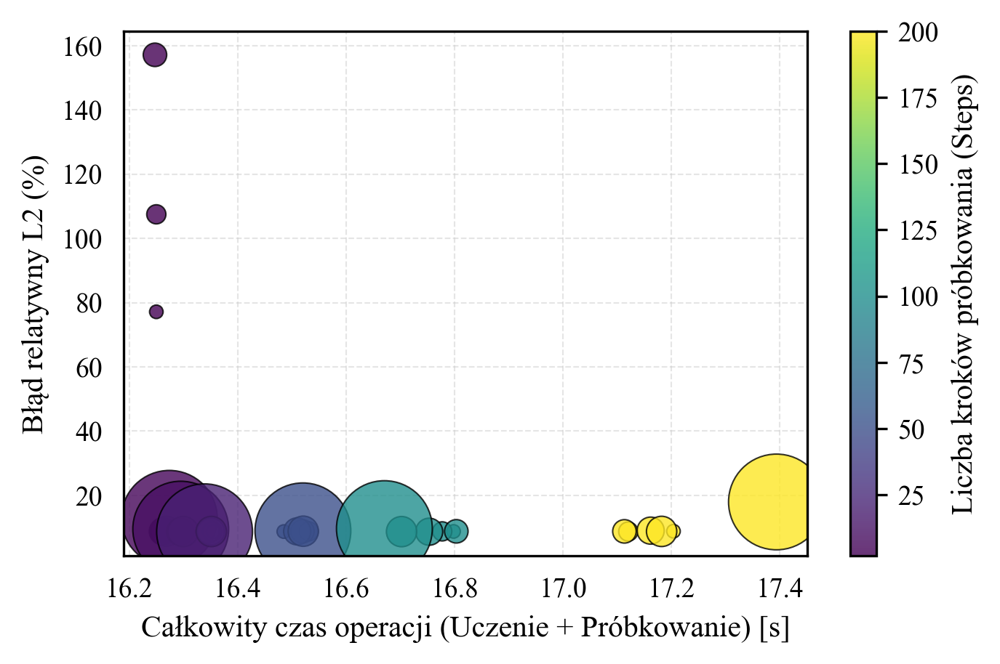

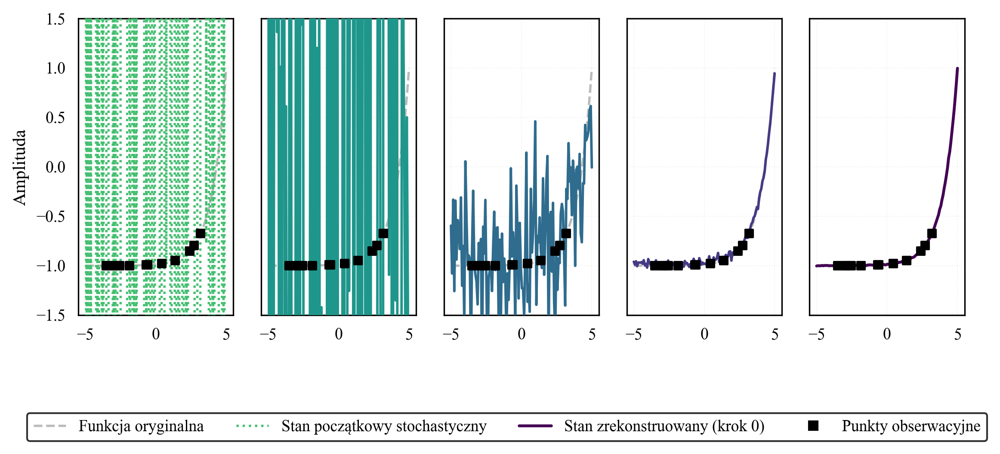

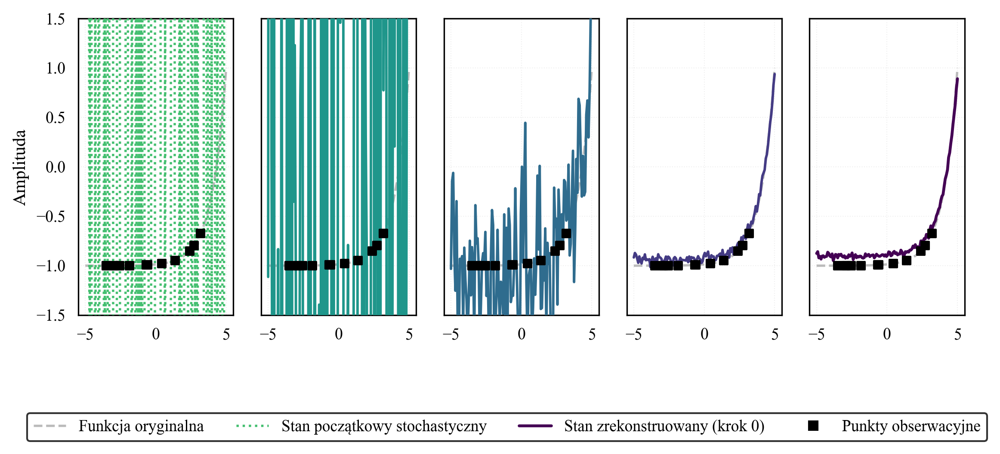

In [14]:
print(f"\n{'='*60}\nGENEROWANIE NOWYCH WYKRESÓW DLA SQUARE_WAVE\n{'='*60}")
for func_name in target_functions:
    # 1. Wykresy macierzy wrażliwości (Heatmaps) - osobno dla Białego Szumu i GRF
    vis.plot_fundps_ablation_heatmap(results_white, func_name, noise_name='White')
    vis.plot_fundps_ablation_heatmap(results_grf, func_name, noise_name='GRF')
    
    # 2. Wykresy optymalizacji czasowej ( scatter plots)
    vis.plot_fundps_time_vs_quality(results_white, func_name, noise_name='White')
    vis.plot_fundps_time_vs_quality(results_grf, func_name, noise_name='GRF')
    
    # 3. Wykres oryginalnej trajektorii odszumiania
    vis.plot_fundps_trajectory(func_name, results_white, noise_name='White')
    vis.plot_fundps_trajectory(func_name, results_grf, noise_name='GRF')

In [15]:
import importlib
import utils.visualisations as vis

# Wymuszenie przeładowania pliku z dysku do pamięci RAM Jupytera
importlib.reload(vis)

<module 'utils.visualisations' from 'C:\\Users\\klaud\\Desktop\\PRACA-MAGISTERSKA-Zastosowanie-modeli-dyfuzyjnych-do-stabilizacji-wykresow-funkcji\\utils\\visualisations.py'>

GENEROWANIE PANELI PORÓWNAWCZYCH 1X2


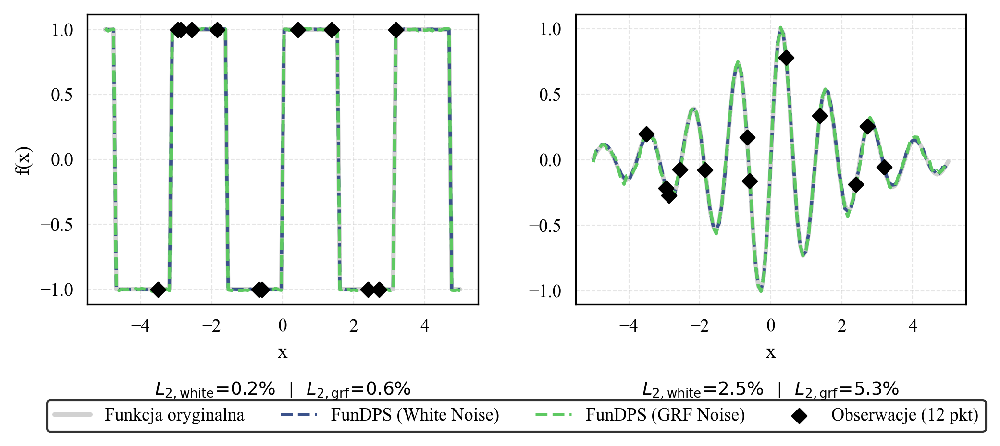

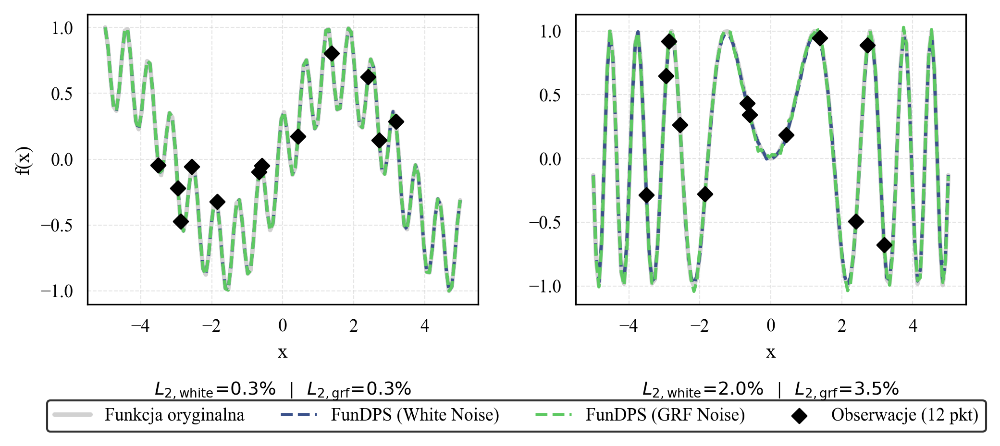

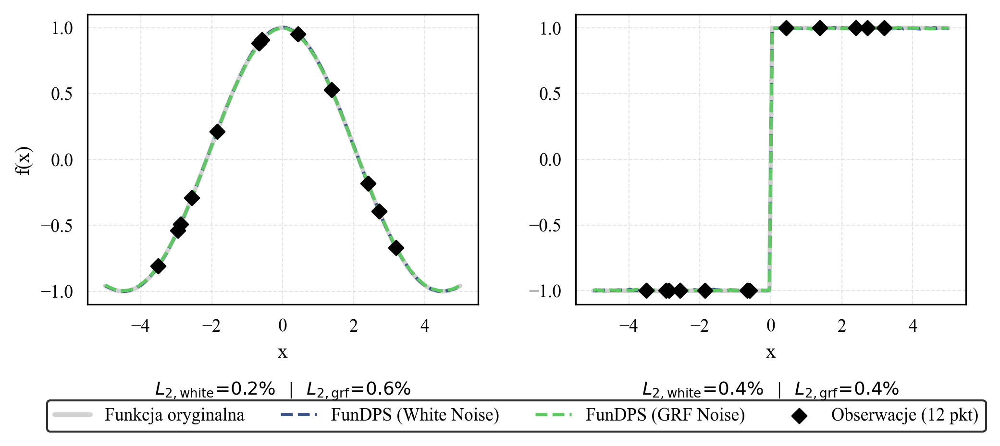

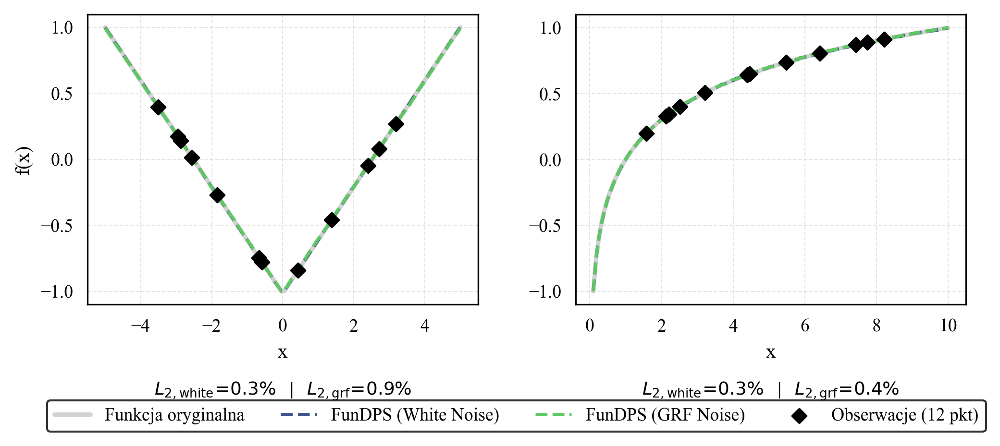

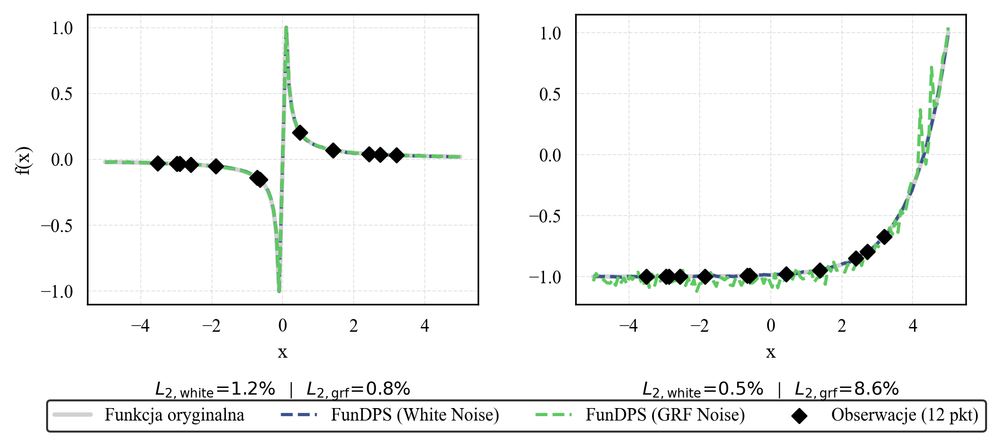

In [16]:
print(f"{'='*60}\nGENEROWANIE PANELI PORÓWNAWCZYCH 1X2\n{'='*60}")

vis.plot_fundps_comparison_batches(target_functions, results_white, results_grf)


GENEROWANIE POŁĄCZONEGO WYKRESU STRATY DLA PRIORA


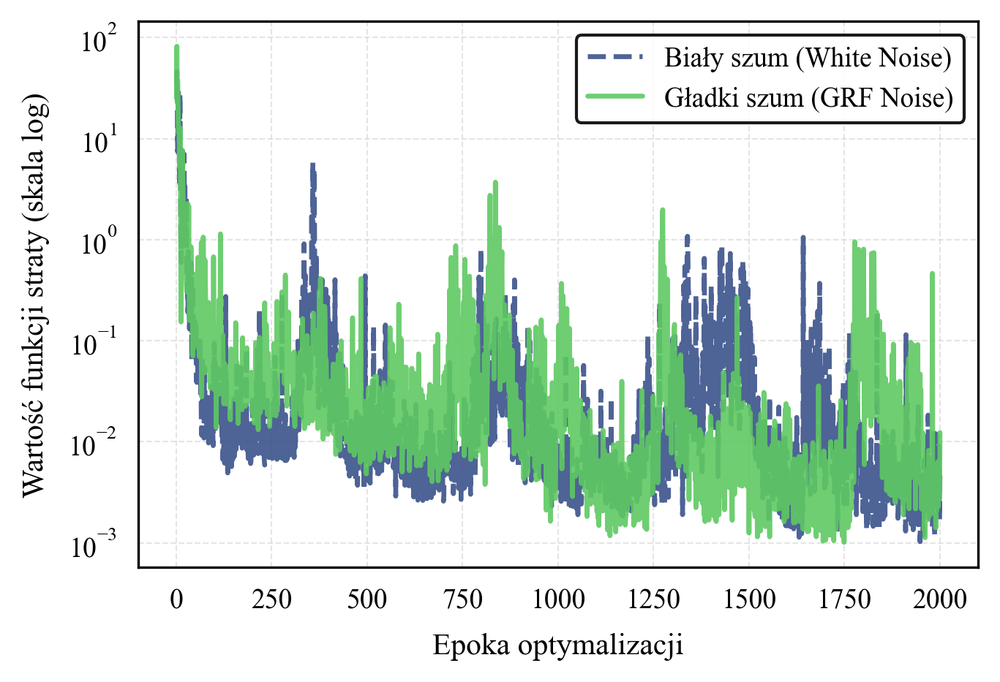

In [17]:
print(f"\n{'='*60}\nGENEROWANIE POŁĄCZONEGO WYKRESU STRATY DLA PRIORA\n{'='*60}")

vis.plot_combined_training_loss(results_white, results_grf, func_name='log10')


GENEROWANIE GLOBALNYCH MAP CIEPŁA


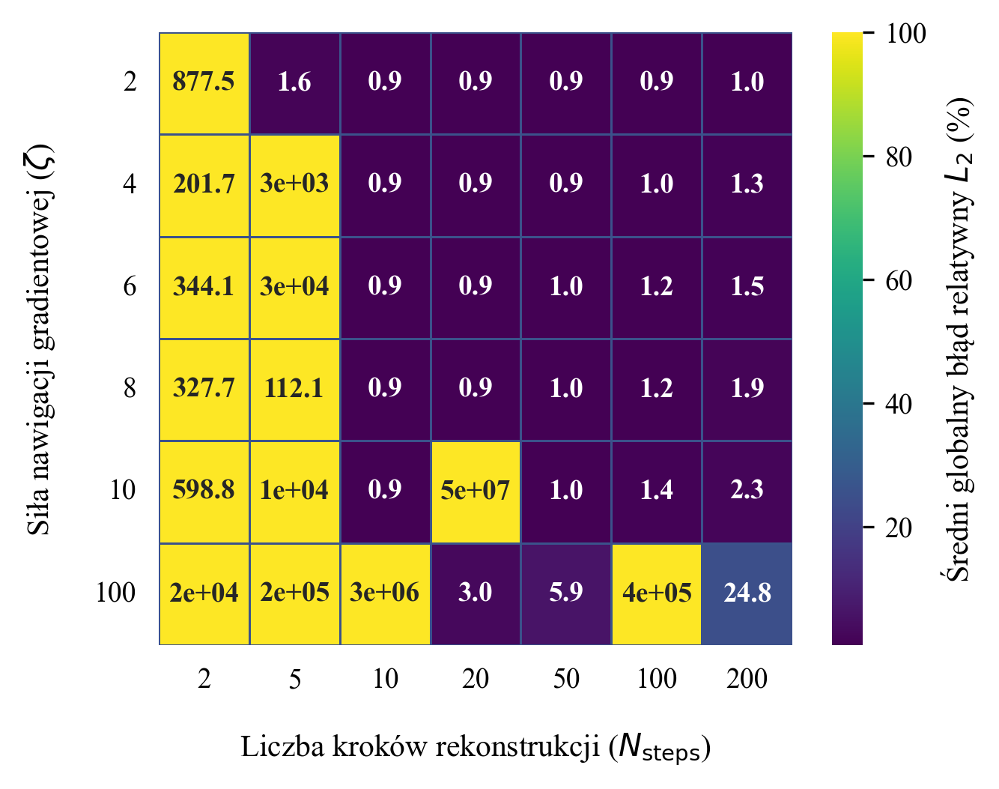

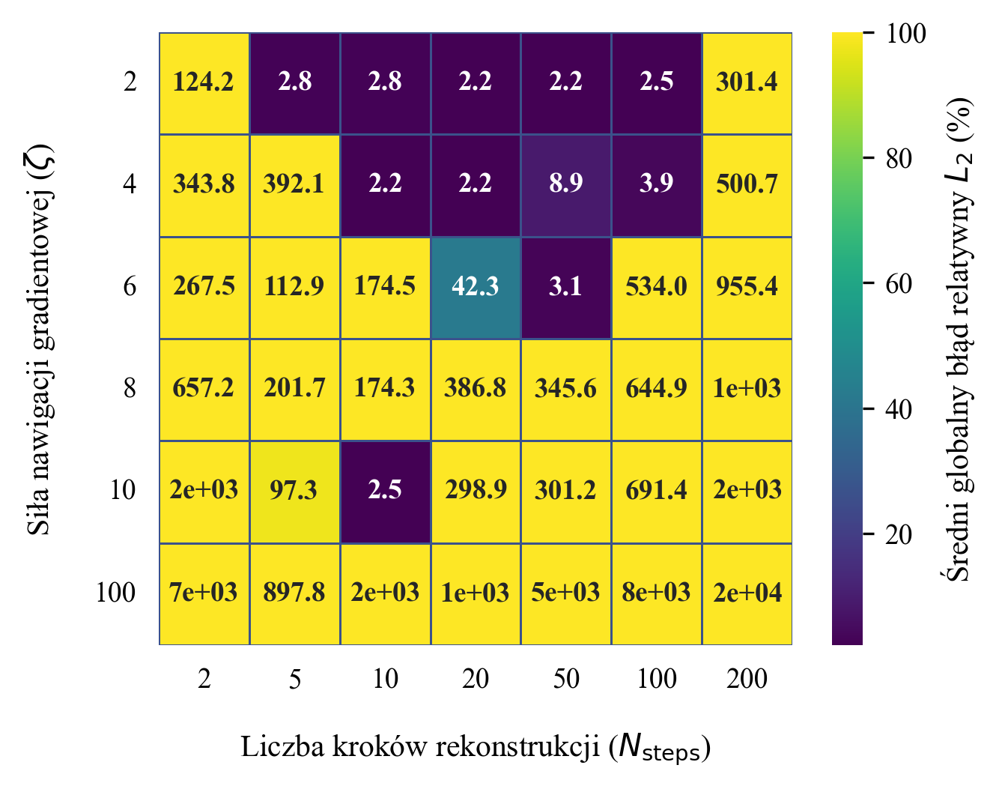

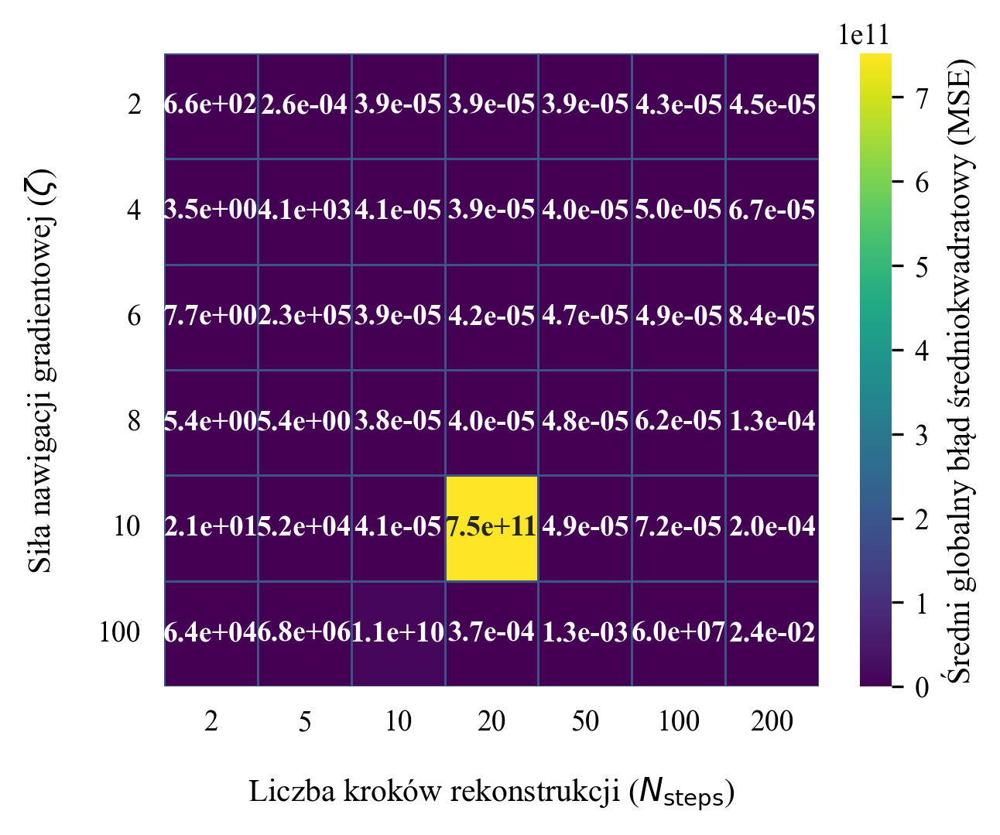

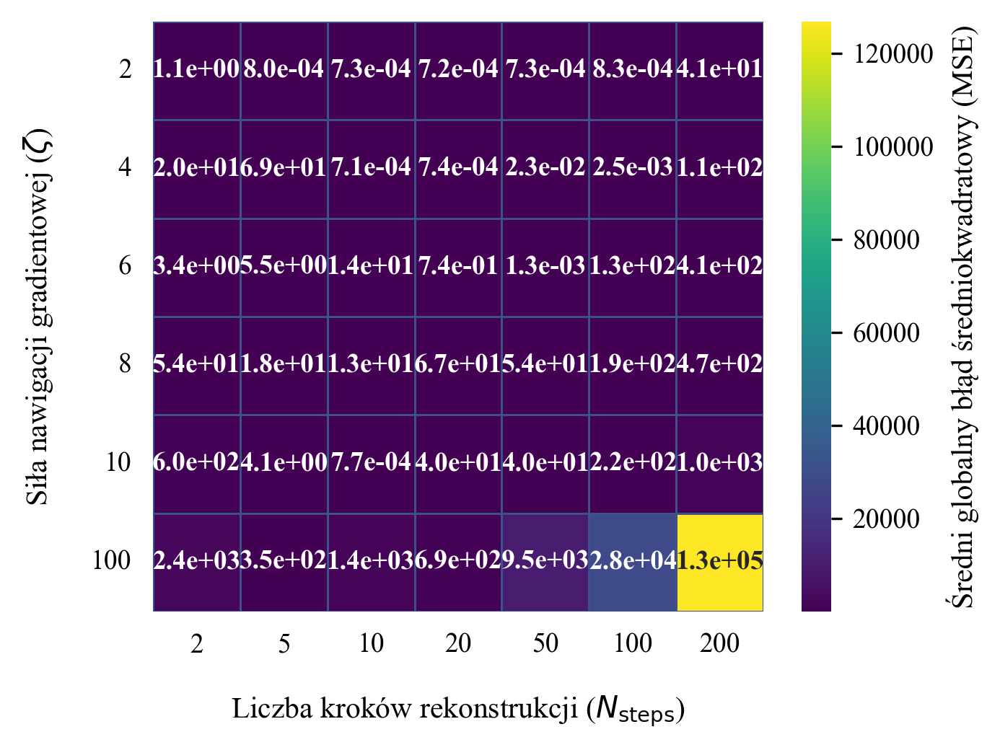

In [18]:
print(f"\n{'='*60}\nGENEROWANIE GLOBALNYCH MAP CIEPŁA\n{'='*60}")

vis.plot_average_fundps_heatmap(results_white, noise_name='White')
vis.plot_average_fundps_heatmap(results_grf, noise_name='GRF')

vis.plot_average_fundps_heatmap(results_white, noise_name='White', metric_name='MSE')
vis.plot_average_fundps_heatmap(results_grf, noise_name='GRF', metric_name='MSE')

In [19]:
import os
import pickle

os.makedirs('experiments/cache/results_cache_3', exist_ok=True)

with open('experiments/cache/results_cache_3/results_fundps_grf.pkl', 'wb') as f:
    pickle.dump(results_grf, f)
with open('experiments/cache/results_cache_3/results_fundps_white.pkl', 'wb') as f:
    pickle.dump(results_white, f)

print("Zapisano wyniki FunDPS do pamięci podręcznej (Cache)")

Zapisano wyniki FunDPS do pamięci podręcznej (Cache)


In [20]:
vis.display_global_fundps_rankings(results_white, results_grf, top_n=5)


In [21]:
df_worst_white = vis.find_worst_fundps_configurations(results_white, noise_name='White')
df_worst_grf = vis.find_worst_fundps_configurations(results_grf, noise_name='GRF')

# vis.plot_fundps_failed_reconstruction(results_white, func_name='abs', worst_steps=20, worst_zeta=10.0, noise_name='White')


# vis.plot_fundps_failed_reconstruction(results_white, func_name='damped_oscillator', worst_steps=20, worst_zeta=2.0, noise_name='White')


                   Najgorsze N_steps  Najgorsza Zeta  Maksymalny błąd L2 (%)
Funkcja                                                                     
SQUARE_WAVE                       10          100.00             33878704.86
DAMPED_OSCILLATOR                  2          100.00                 5934.87
MIXED_FREQ                         2          100.00                 9834.40
CHIRP                              5          100.00               773370.71
SINC                               5          100.00               239399.05
STEP                               2          100.00                 4350.30
ABS                               20           10.00            467637673.55
LOG10                              5          100.00               113304.89
1_OVER_X                           2          100.00                 3171.00
EXP                                2          100.00                10187.27
                   Najgorsze N_steps  Najgorsza Zeta  Maksymalny błąd L2 (%)

In [22]:
df_best_white = vis.find_best_fundps_configurations(results_white, noise_name='White')
df_best_grf = vis.find_best_fundps_configurations(results_grf, noise_name='GRF')

                   Optymalne N_steps  Optymalna Zeta  Minimalny błąd L2 (%)
Funkcja                                                                    
SQUARE_WAVE                       20            2.00                   0.18
DAMPED_OSCILLATOR                  5            4.00                   2.49
MIXED_FREQ                        10            2.00                   0.27
CHIRP                             10            2.00                   2.02
SINC                              10           10.00                   0.22
STEP                              10            8.00                   0.41
ABS                               20            6.00                   0.27
LOG10                             20            4.00                   0.30
1_OVER_X                          10           10.00                   1.16
EXP                               10            4.00                   0.52
                   Optymalne N_steps  Optymalna Zeta  Minimalny błąd L2 (%)
Funkcja     

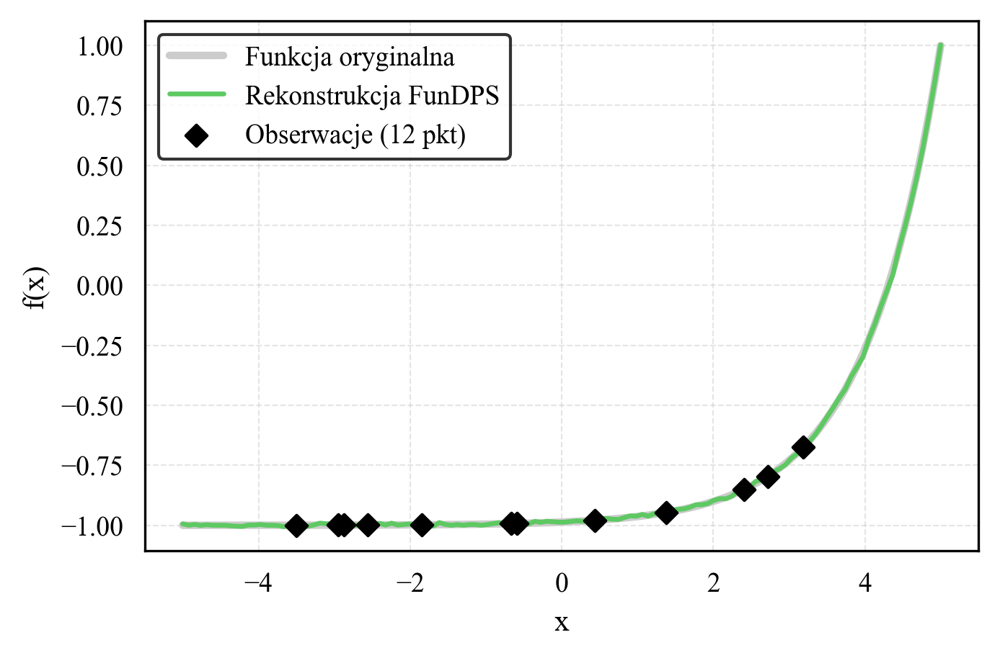

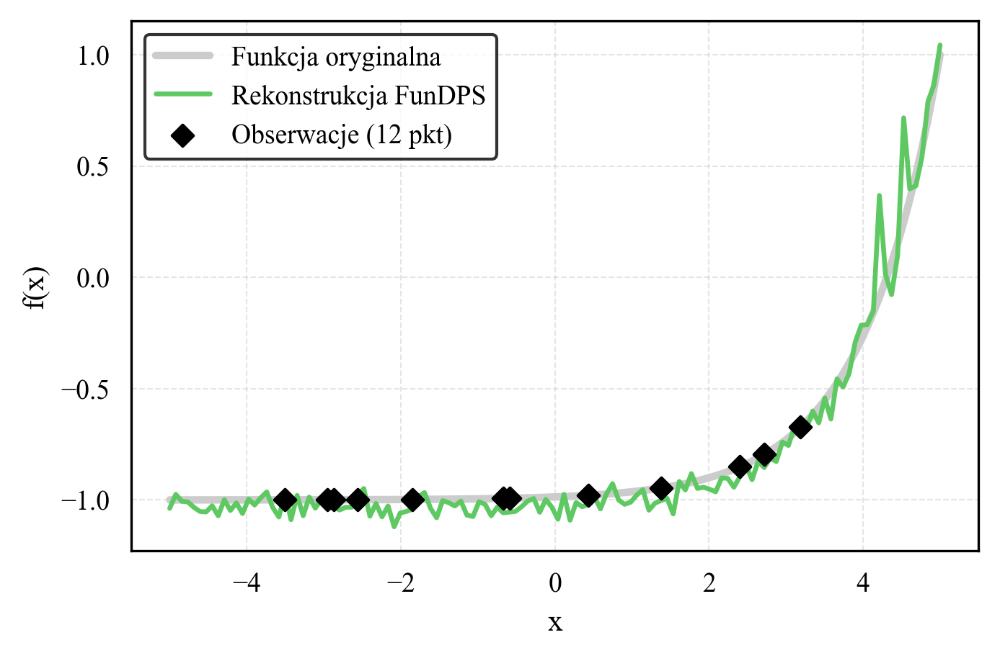

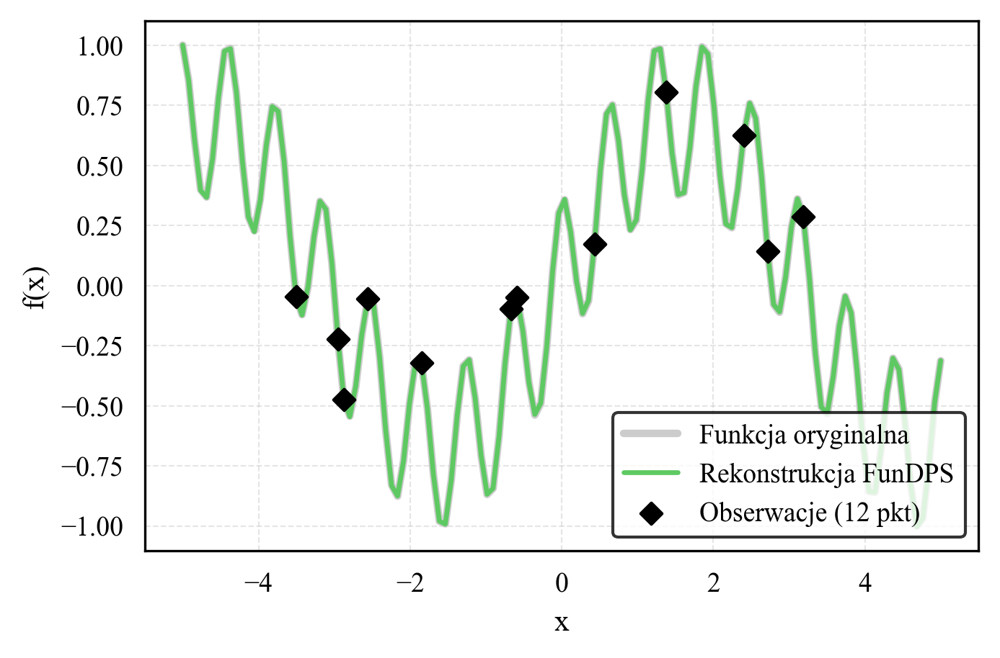

In [23]:
vis.plot_fundps_optimal_reconstruction(results_white, func_name='exp', noise_name='White')
vis.plot_fundps_optimal_reconstruction(results_grf, func_name='exp', noise_name='GRF')
vis.plot_fundps_optimal_reconstruction(results_white, func_name='mixed_freq', noise_name='White')


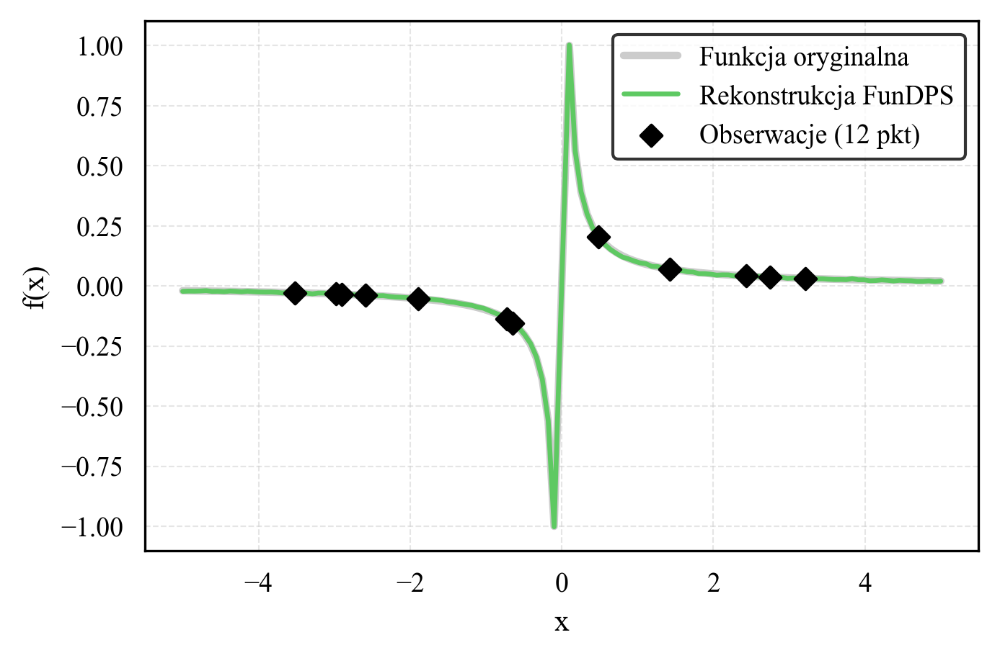

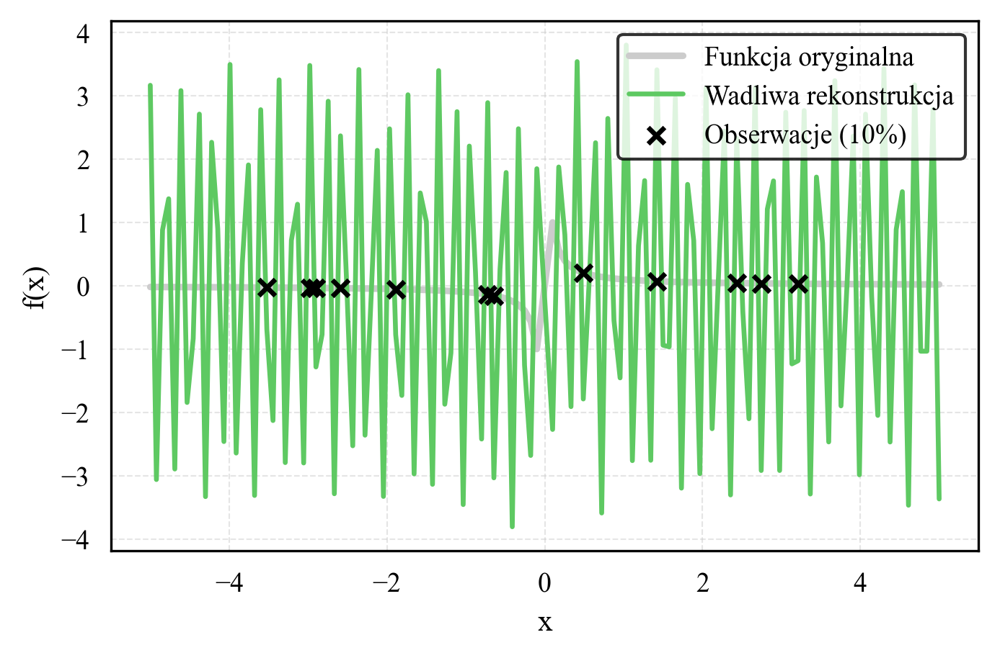

In [24]:
vis.plot_fundps_optimal_reconstruction(results_white, func_name='1_over_x', noise_name='White')
vis.plot_fundps_failed_reconstruction(results_white, func_name='1_over_x', worst_steps=5, worst_zeta=100.0, noise_name='White')


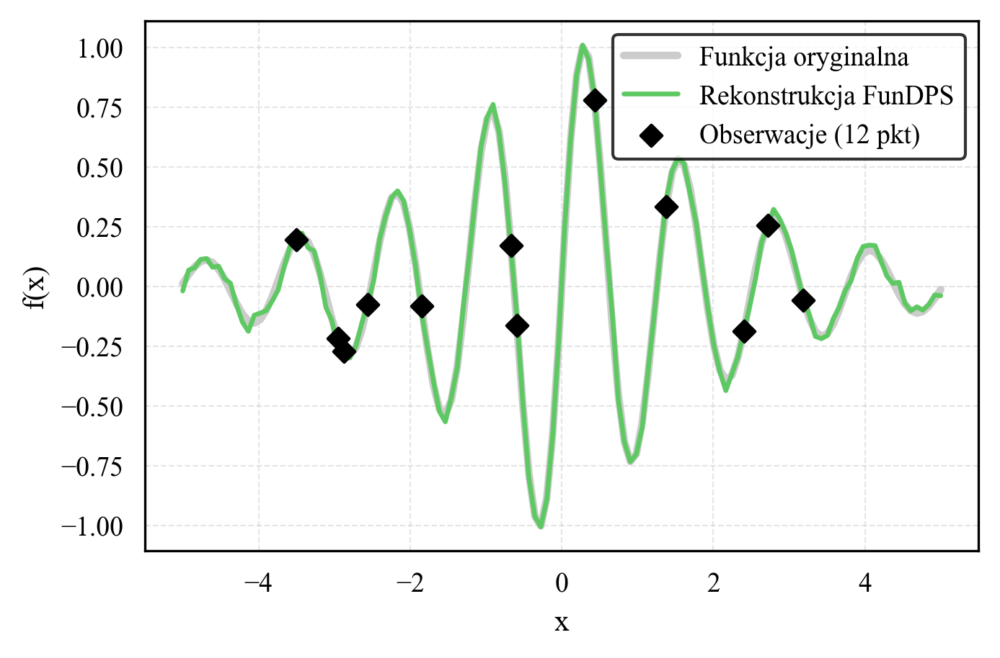

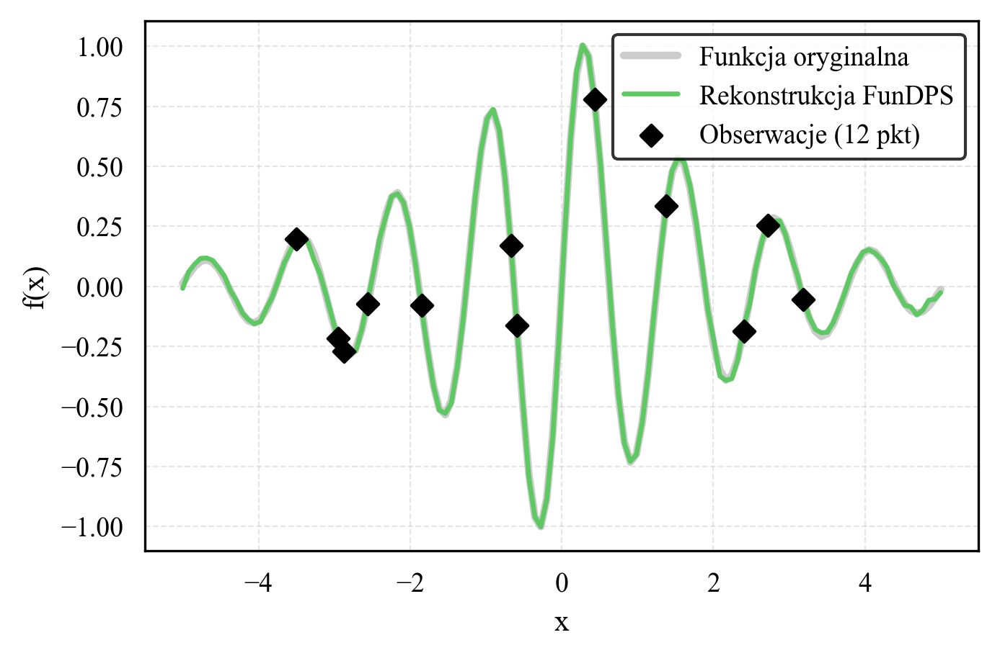

In [25]:
vis.plot_fundps_optimal_reconstruction(results_grf, func_name='damped_oscillator', noise_name='GRF')
vis.plot_fundps_optimal_reconstruction(results_white, func_name='damped_oscillator', noise_name='White')

In [27]:
\vis.plot_parameter_matrix_zoom(results_white, noise_name='White')
vis.plot_parameter_matrix_zoom(results_grf, noise_name='GRF')

SyntaxError: unexpected character after line continuation character (627246585.py, line 1)